# Porównanie algorytmów i szukanie odpowiednich parametrów
#### Algorytmy
* random - w każdym kroku losuje n kształtów, wybiera najlepszy
* simple - losuje n kształtów, wybiera najlepszy, na którym wykonuje m kroków podmieniania średniej przy użyciu k sampli
* natural - natural evolution strategies, losuje n kształtów, wybiera najlepszy, na którym wykonuje m kroków przy uzyciu k sampli

Wszystkie runy odpalane z parametrami:
* random = 100
* sample = 20
* step = 50

* num shapes = 100

3 testowane obrazki:

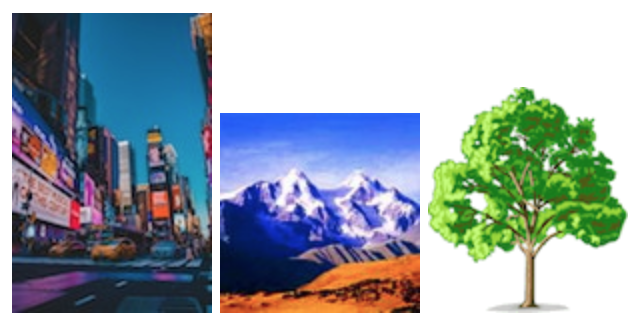

## Random

Każdy obrazek rysowany 10 razy.

### ilość kształtów vs mse
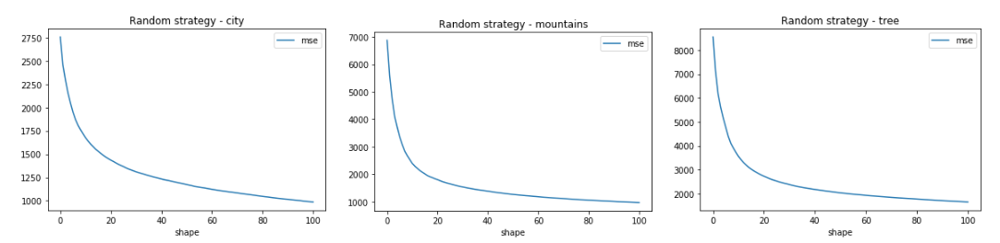

### Najgorsze vs najlepsze obrazki
względem mse

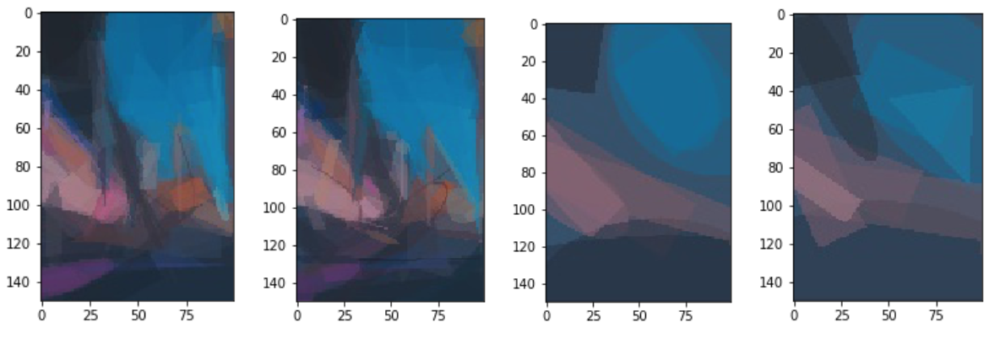
od lewej: najlepszy n=100, najgorszy n=100, najlepszy n=10, najgorszy n=10

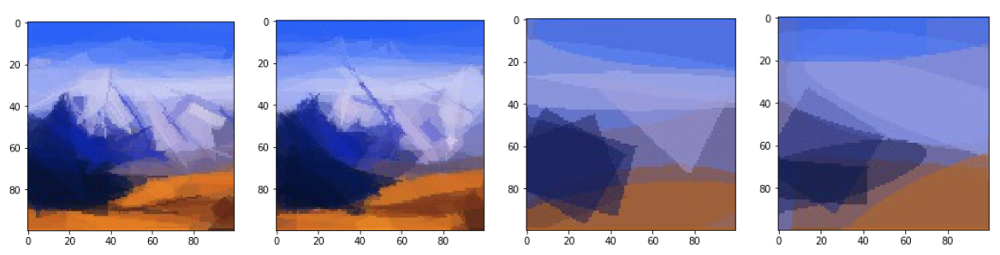
od lewej: najlepszy n=100, najgorszy n=100, najlepszy n=10, najgorszy n=10

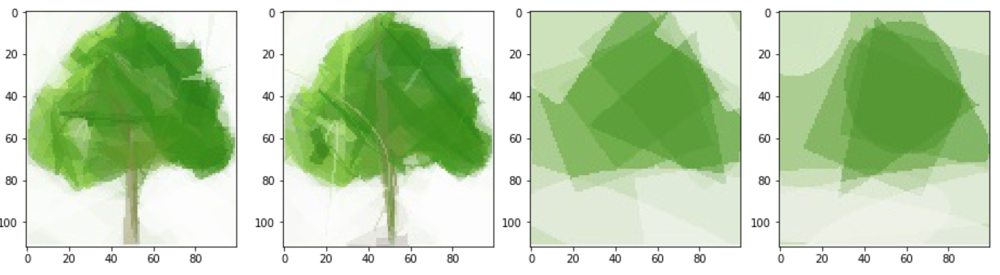
od lewej: najlepszy n=100, najgorszy n=100, najlepszy n=10, najgorszy n=10

Różnice pomiędzy najlepszymi a najgorszymi obrazkami są bardziej widoczne przy mniejszej ilości akcji (przy drzewie to dobrze widać)

## Simple

Każdy obrazek rysowany 10 razy (za każdym razem z inną sigmą)

Przetestowane sigmy:  
[0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1 ]  


(To jest tak na prawdę wartość, przez którą mnożona jest długość przedziału danego parametru i dopiero wynik tego mnożenia jest prawdziwą sigmą rozkładu. Przykład: współrzędna x środka elipsy na obrazku 100x100 będzie miała długośc przedziału = 100, jeżeli factor = 0.03 to sigma = 3)


### simgy vs mse

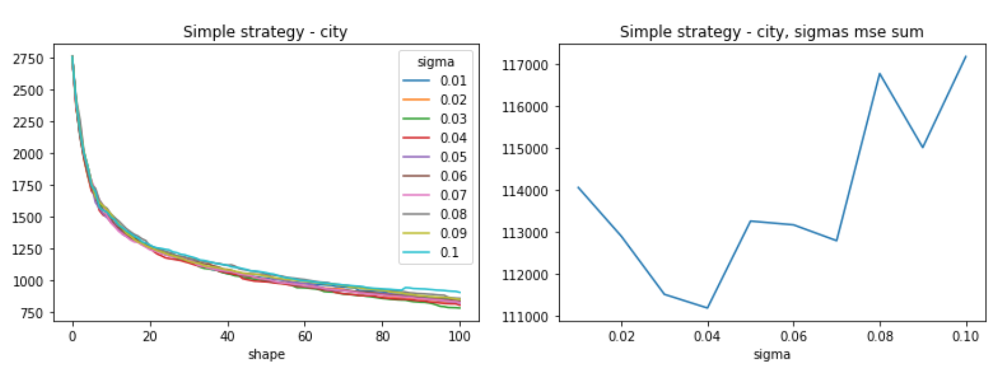
Prawy wykres - dla każdej sigmy suma mse po wszystkich akcjach

Wniosek:   
najlepsza sigma = 0.04  
najgorsza sigma = 0.1

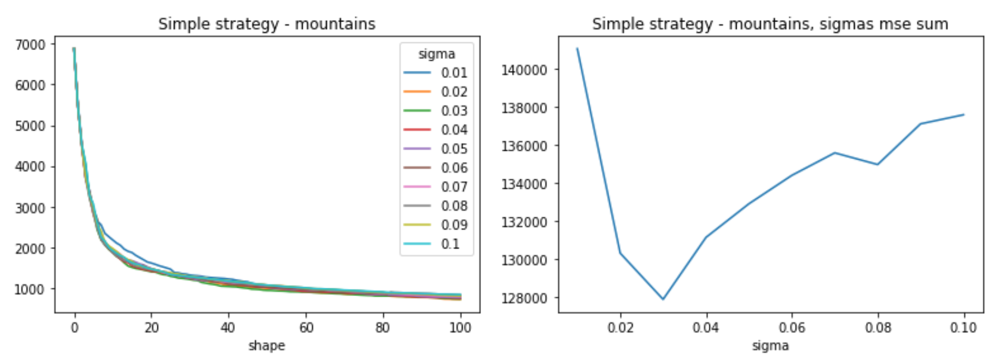

Wniosek:   
najlepsza sigma = 0.03   
najgorsza sigma = 0.01   

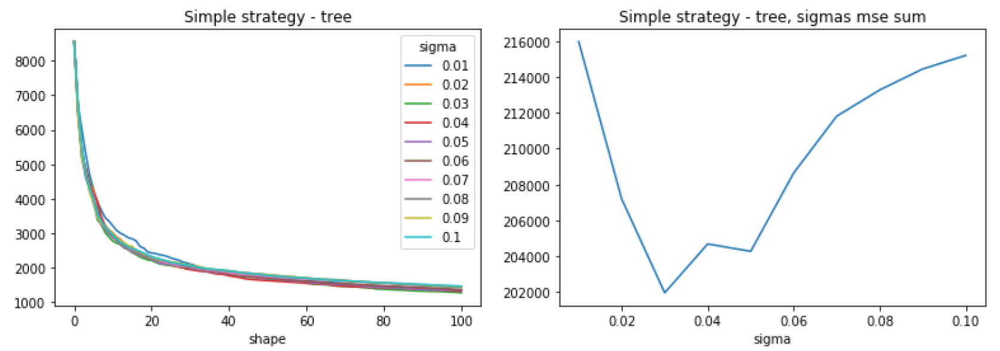

Wniosek:   
najlepsza sigma = 0.03   
najgorsza sigma = 0.01

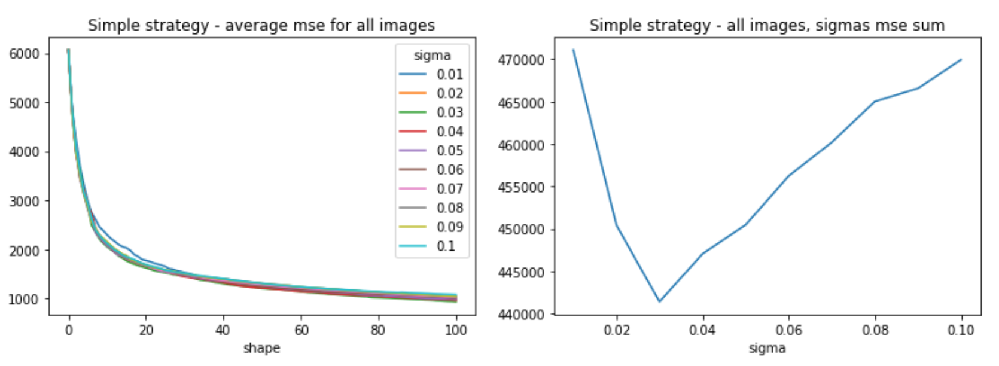

Ostatecznie wychodzi na to, że **sigma = 0.03** sprawdza się najlepiej.   
Jednak z lewych wykresów widać, że różnice między różnymi sigmami nie są jakoś specjalnie duże, więc algorytm jest dosyć podporny na wybór tego parametru.

### Najgorsze vs najlepsze obrazki
względem mse

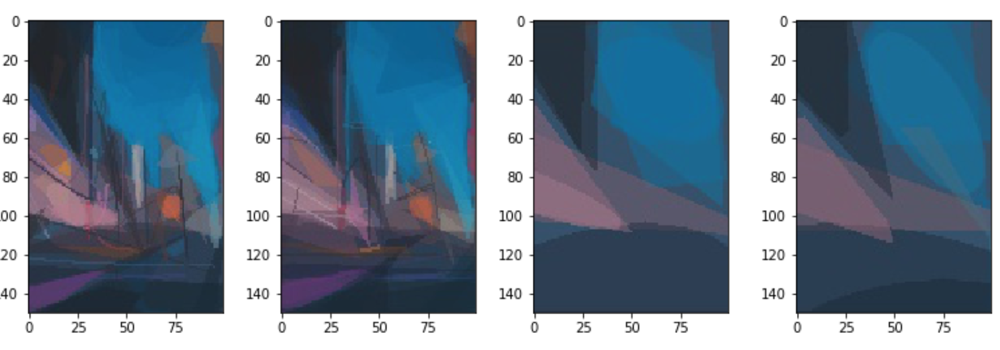
od lewej: najlepszy n=100, najgorszy n=100, najlepszy n=10, najgorszy n=10

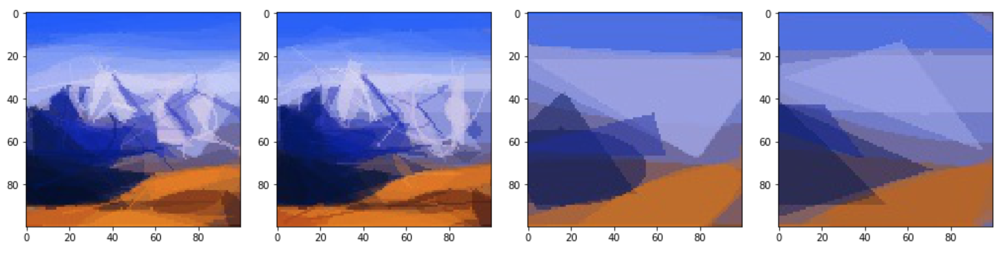
od lewej: najlepszy n=100, najgorszy n=100, najlepszy n=10, najgorszy n=10

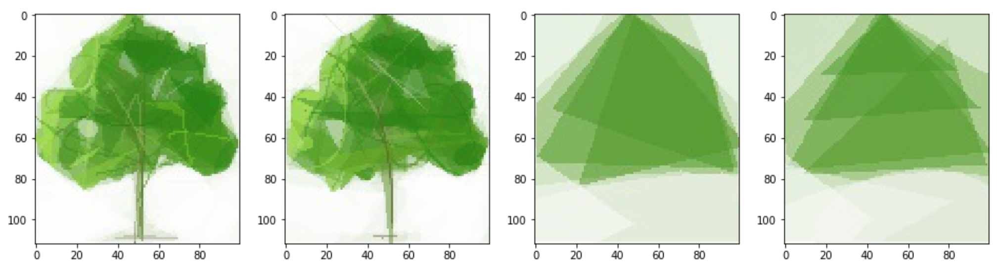
od lewej: najlepszy n=100, najgorszy n=100, najlepszy n=10, najgorszy n=10

### Natural

Każdy obrazek rysowany 70 razy - 7 optimizerów x 10 lr

Przetestowane optimizery: 

['sgd', 'momentum', 'nesterov', 'adagrad', 'rmsprop', 'adadelta', 'adam']

Przetestowane lr:

[ 0.01  0.02  0.04  0.1  0.21  0.46  1.  2.15  4.64 10.]

### Testy optimizerów

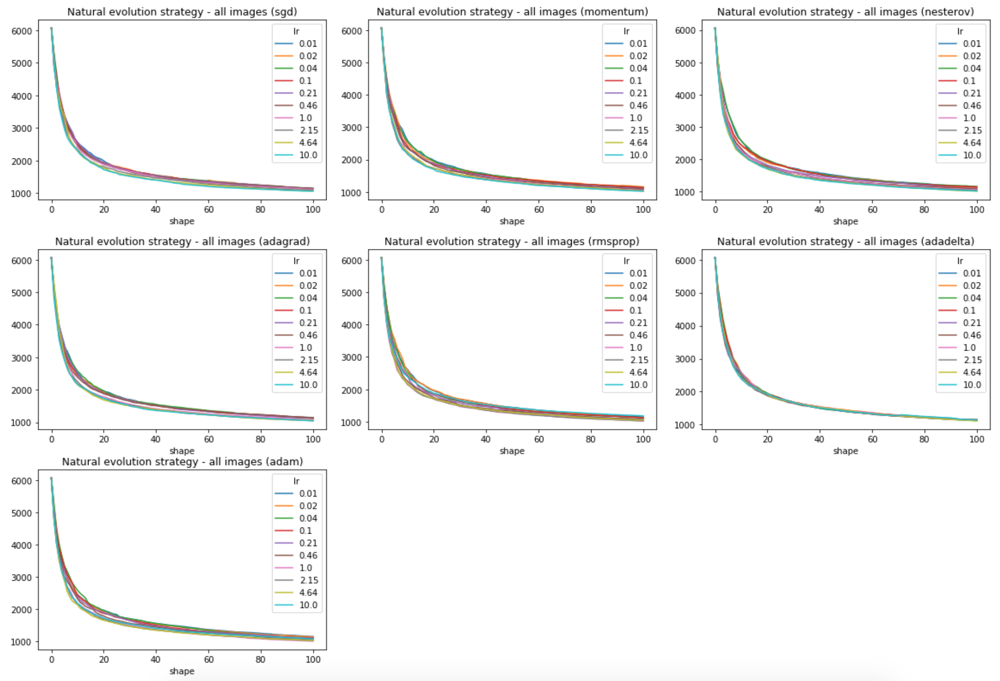

Wyniki dosyć podobne, wybór lr też nie zmienia znacząco mse

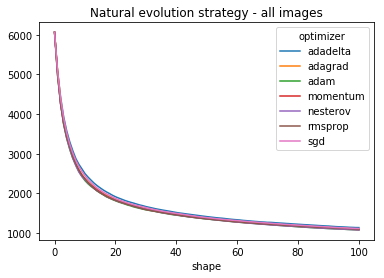

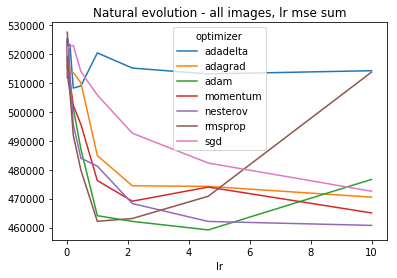

Wniosek:   
najlepszy optimizer = adam   
najlepszy lr = 4.64  

### Najgorsze vs najlepsze obrazki
względem mse

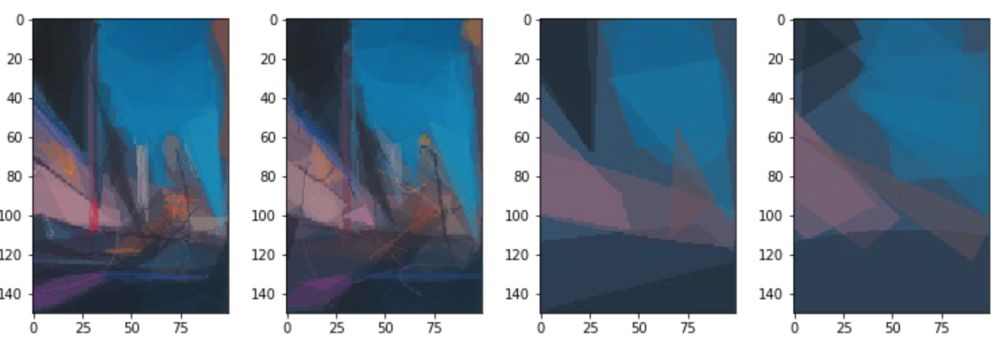
od lewej: najlepszy n=100, najgorszy n=100, najlepszy n=10, najgorszy n=10

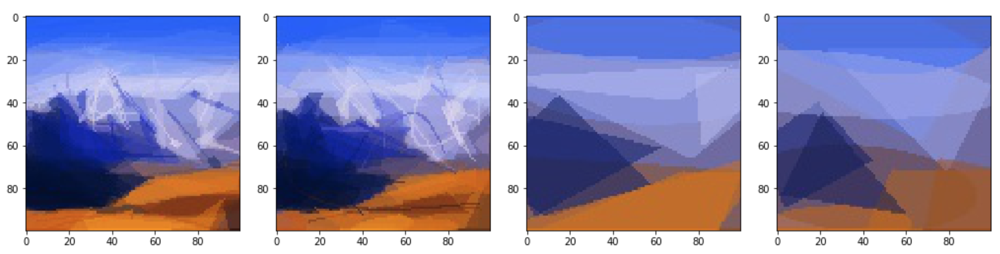
od lewej: najlepszy n=100, najgorszy n=100, najlepszy n=10, najgorszy n=10

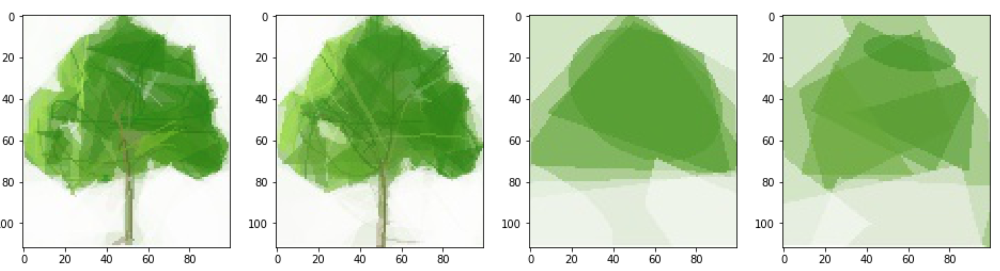
od lewej: najlepszy n=100, najgorszy n=100, najlepszy n=10, najgorszy n=10

# Wnioski

W przypadku wszystkich trzech algorytmów wyszło plus minus, że parametry zbytnio nie wpływają na końcowy efekt wizualny - obrazki "najgorsze" pod kątem mse nie różnią się bardzo od tych "najlepszych" (w późniejszej fazie, przy mniejszej ilości akcji różnica jest zauważalna) i w pewnym przypadkach nawet ciężko jest stwierdzić, który jest tym lepszy, a który tym gorszym

# Porównanie algorytmów

Dla random strategy średnia z wszystkich runów  
Dla simple evolution strategy run z sigmą = 0.03   
Dla natural evolution strategy run z sigmą = 0.03, adamem i lr = 4.64

## Score

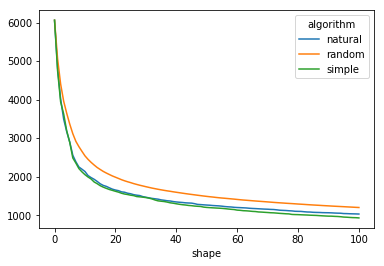

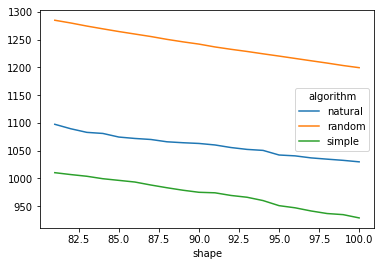

## Średnie obrazki
W kolejności random, simple, natural

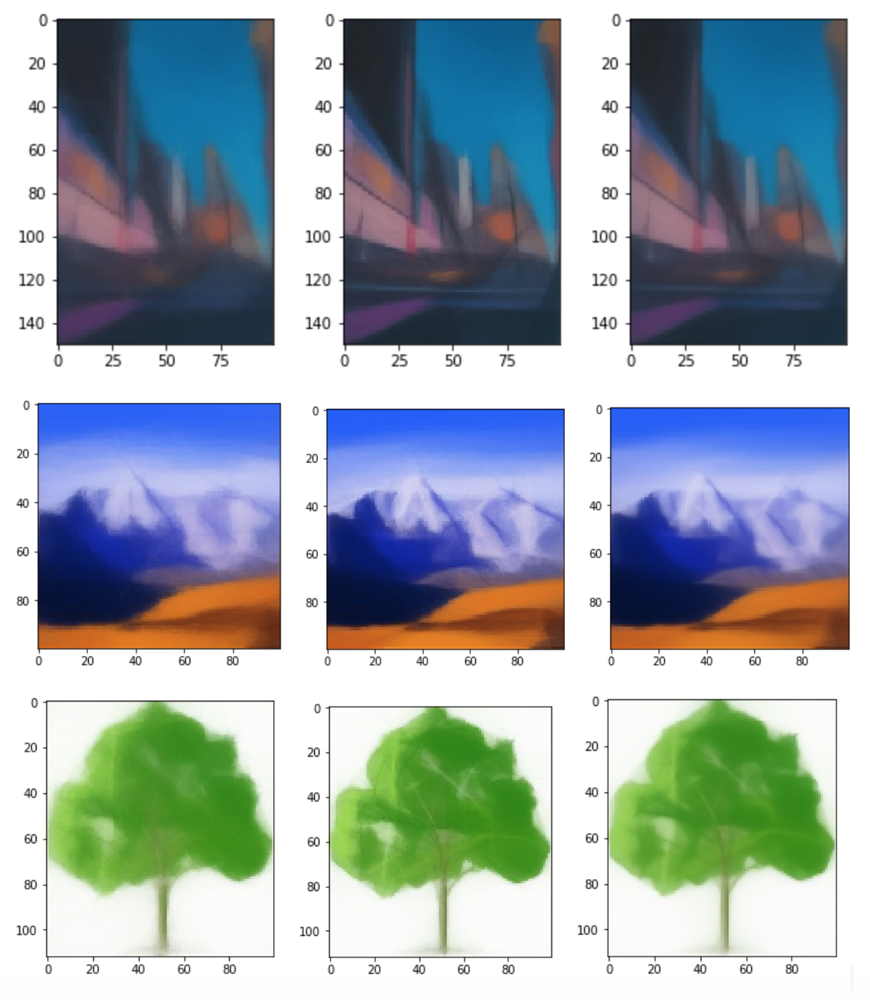

Algorytm podmieniający średnią (środkowe obrazki) ma najostrszejszy średni wynik co wskazuje na to, że jego działanie jest najbardziej deterministyczne.   
Średnie simple i natural (środek i prawy) wyglądają niemal identycznie pomijając rozmycie.

## Najlepsze obrazki n = 100
W kolejności random, simple, natural

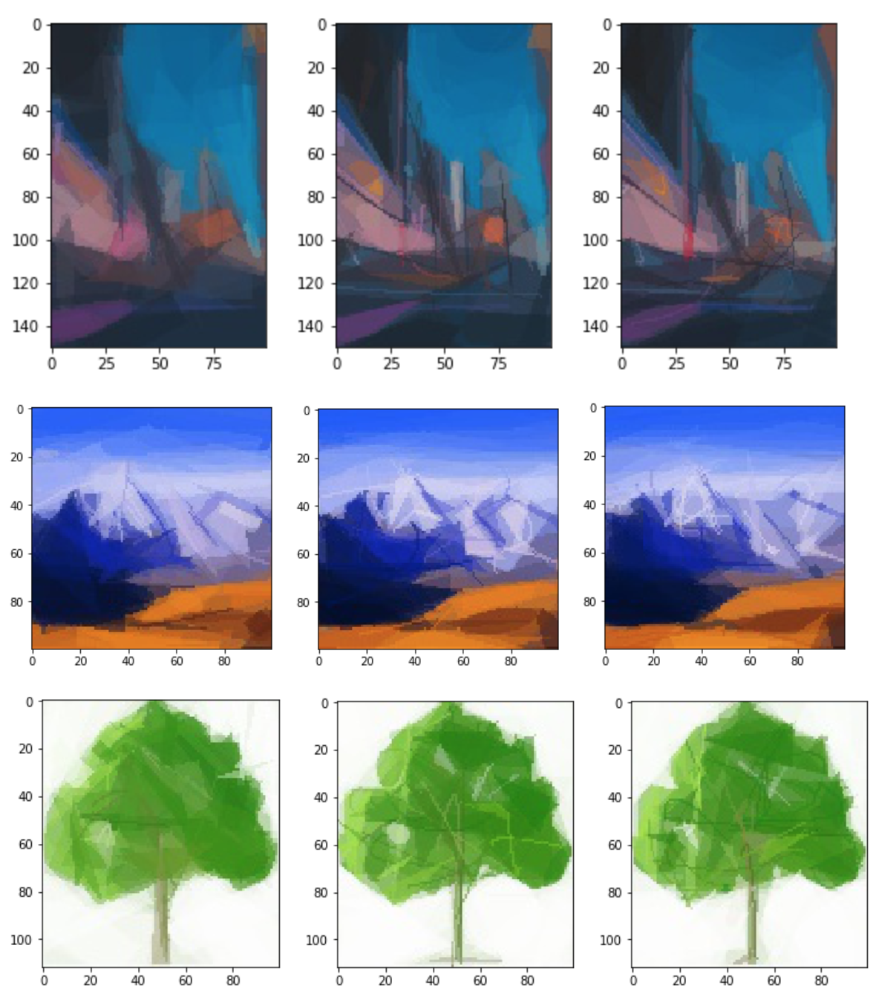

## Najlepsze obrazki n = 10
W kolejności random, simple, natural

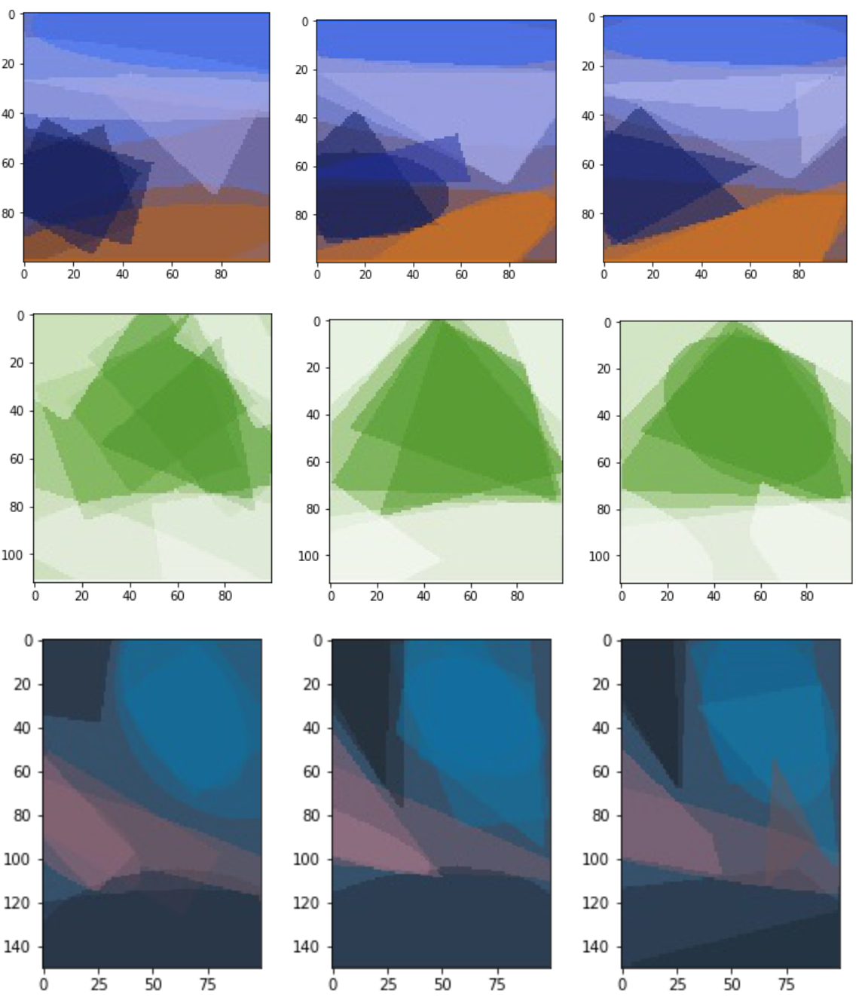

## Wnioski

Simple wydaje się działać trochę lepiej niż natural :(

# Testy parametrów random, sample, step
random - ilość kształtów losowanych przed rozpoczęciem evolution strategies   
sample - ilość sampli w każdym kroku evolution strategies  
step - ilość kroków evolution strategies

In [1]:
# random, sample, step
parameters = [
    (100, 10, 100),
    (100, 20, 50),
    (100, 25, 40),
    (100, 40, 25),
    (100, 50, 20),
    (100, 100, 10),
    (100, 125, 8),
    (100, 8, 125),
    (100, 5, 200),
    (100, 200, 5)
]

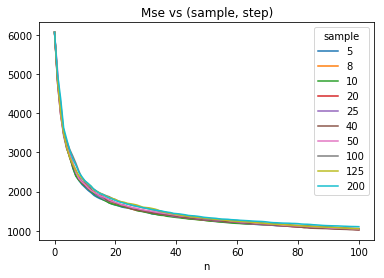

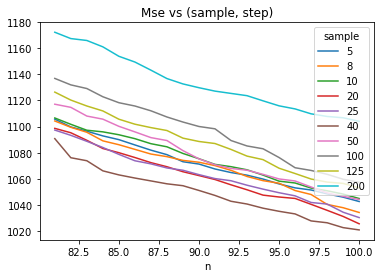

Na plocie tylko sample, bo step się uzupełnia (sample * step = 1000)

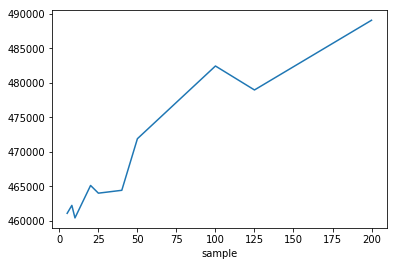

Stosunek sample do step wydaje się nie mieć znaczącego wpływu na loss, jednak sumując kolejne mse wychodzi, że pod tym względem lepiej jest wybrać mniej sampli, a więcej stepów.

Wniosek:   
najlepsza para sample, step = (10, 100)   
random we wszystkich runach przyjęłam na 100

# Score vs zwiększanie ilości kroków algorytmu
Na podstawie poprzednich wykresów przyjęłam, że najlepiej sprawdza się stosunek sample:step = 1:10

In [2]:
# sample, step
parameters = [
    (1, 10),
    (2, 20),
    (3, 30),
    (4, 40),
    (5, 50),
    (6, 60),
    (7, 70),
    (8, 80),
    (9, 90),
    (10, 100),
    (11, 110),
    (12, 120),
    (13, 130),
    (14, 140),
    (15, 150),
    (16, 160),
    (17, 170),
    (18, 180),
    (19, 190),
    (20, 200),
]

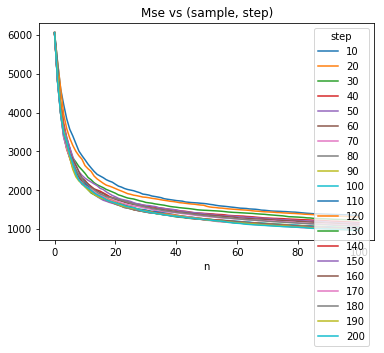

Na tym wykresie widać chyba największą różnicę dotychczas pomiędzy różnymi parametrami a wynikowym mse. Nie jest to jednak dziwne, że im dłużej się szuka najlepszego kształtu tym lepszy znajdujemy.

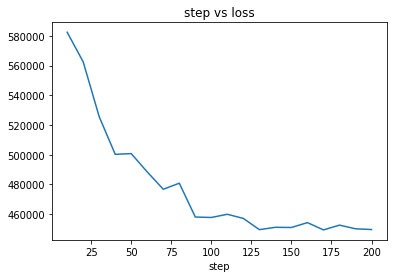

Czyli mniej więcej przy step = 100 się wypłaszcza - czyli więcej kroków nie znajduje już zazwyczaj żadnego dużo lepszego kształtu do narysowania niż ten, który już został znaleziony.

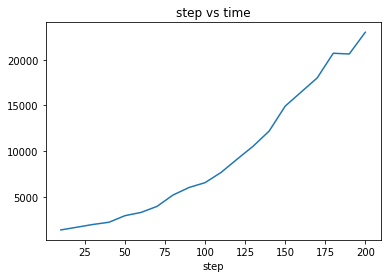

Czas działania algorytmu rośnie liniowo (a nawet trochę bardziej) wraz ze wzrostem ilości kroków, więc raczej nie opłaca się wybierać większej ilości kroków niż ~100, ponieważ zysk w mse będzie stosunkowo mały. Jednak jak widać niżej, jest różnica (głównie jeżeli chodzi o szczegóły) pomiędzy step = 100 a step = 200.

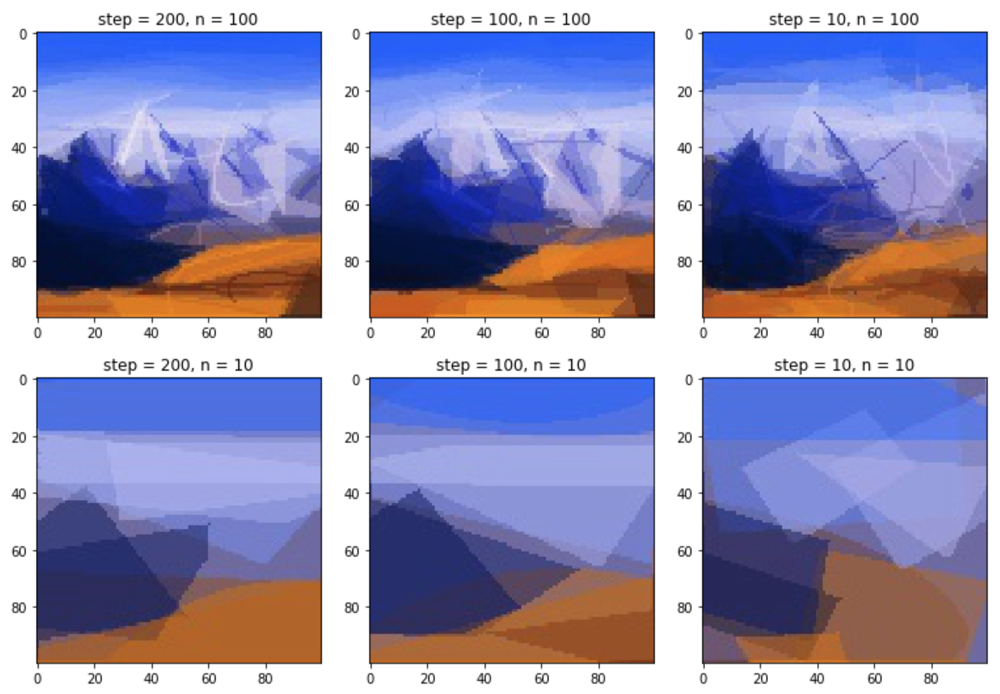

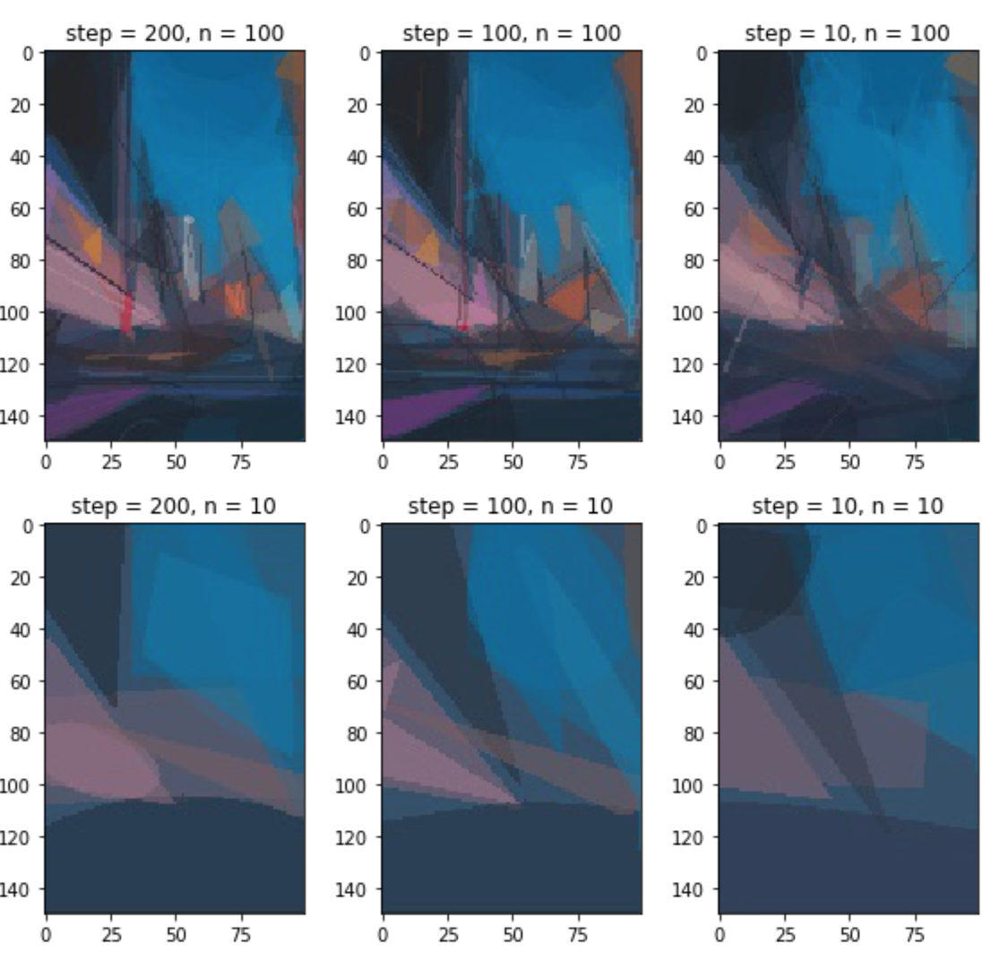

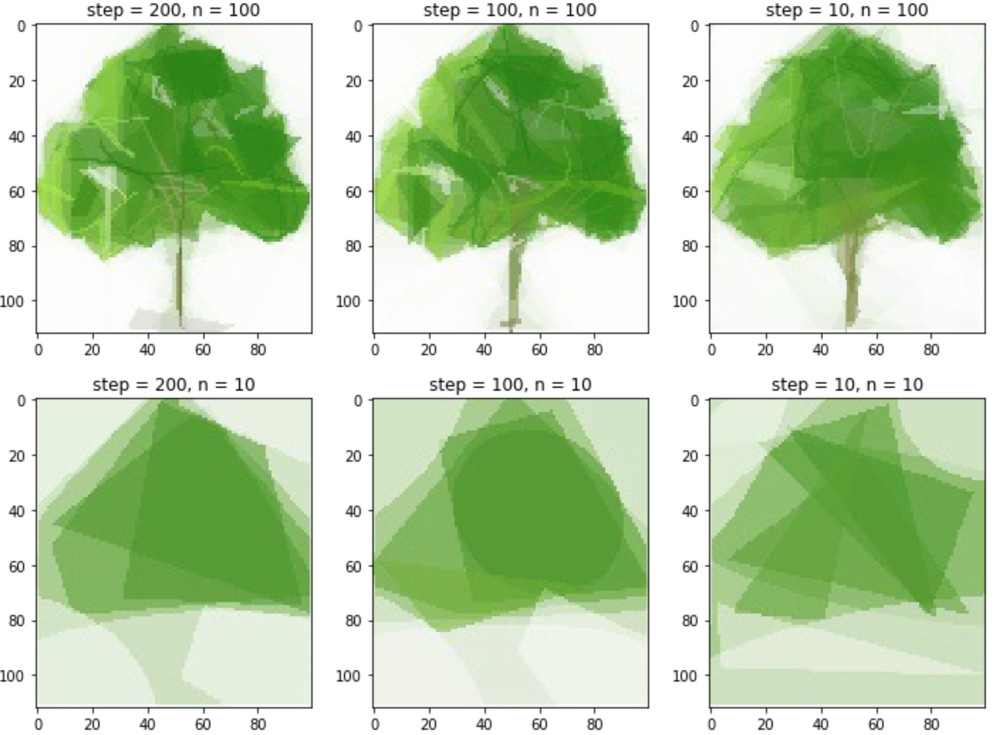